We are using 5 classes audio sound(Children Sound , Tanpura, Traditional, Traffic, Train) . For classifiy data sound , here using the 1D CNN model.

# Installing library...

In [1]:
## Installing all the library.....

!pip install librosa
!pip install pytube
!pip install librosa numpy
!pip install soundfile
!pip install pydub
!pip install resampy
!pip show resampy
!pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 30.6 MB/s eta 0:00:00
Name: resampy
Version: 0.4.2
Summary: Efficient signal resampling
Home-page: https://github.com/bmcfee/resampy
Author: Brian McFee
Author-email: brian.mcfee@nyu.edu
License: ISC
Location: /usr/local/lib/python3.10/dist-packages
Requires: numba, numpy
Required-by: 


# import all modules

In [68]:
#Importing all the files...........
import IPython.display as ipd
import librosa
import librosa.display
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from pydub import AudioSegment
import csv
import os
%matplotlib inline

# Splitting Audio files

In [3]:
# creating a folder in a given directory.......
os.makedirs('/content/sample')

In [ ]:
from pydub import AudioSegment
from pydub.playback import play

input_audio_files = ['/content/drive/MyDrive/MLR/Audio/a_Sound Sample/Children_class_noise.mp3',
                     '/content/drive/MyDrive/MLR/Audio/a_Sound Sample/Tanpura.mp3',
                     '/content/drive/MyDrive/MLR/Audio/a_Sound Sample/Traditional_Song.mp3',
                     '/content/drive/MyDrive/MLR/Audio/a_Sound Sample/Traffic.mp3',
                     '/content/drive/MyDrive/MLR/Audio/a_Sound Sample/TraiN.mp3']

for file in input_audio_files:

    audio = AudioSegment.from_file(file, format="mp3")

    target_sample_rate = 44100

    resampled_audio = audio.set_frame_rate(target_sample_rate)

    output_file = "/content/sample/" + file.split("/")[-1].replace(".mp3", "_resampled.wav")
    resampled_audio.export(output_file, format="wav")


In [ ]:
input_audio_files = ['/content/sample/Children_class_noise_resampled.wav',
                     '/content/sample/Tanpura_resampled.wav',
                     '/content/sample/Traditional_Song_resampled.wav',
                     '/content/sample/Traffic_resampled.wav',
                     '/content/sample/TraiN_resampled.wav']

for file in input_audio_files:
    data, sample_rate = librosa.load(file, sr=None)  # Setting sr=None returns the original sample rate

    # Print the sample rate for each file
    print(f"The sample rate of {file} is: {sample_rate} Hz")


The sample rate of /content/sample/Children_class_noise_resampled.wav is: 44100 Hz
The sample rate of /content/sample/Tanpura_resampled.wav is: 44100 Hz
The sample rate of /content/sample/Traditional_Song_resampled.wav is: 44100 Hz
The sample rate of /content/sample/Traffic_resampled.wav is: 44100 Hz
The sample rate of /content/sample/TraiN_resampled.wav is: 44100 Hz


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import random
import csv
from pydub import AudioSegment

def create_folders(output_dir, num_folders):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for i in range(num_folders):
        folder_path = os.path.join(output_dir, f"folder_{i+1}")
        os.makedirs(folder_path)

def trim_and_label_audio(input_files, output_dir, segment_duration=4000, num_segments_per_class=750):
    create_folders(output_dir, 10)  # Create 10 folders

    csv_data = []
    segment_count = 0

    for class_id, input_file in enumerate(input_files, start=1):
        audio = AudioSegment.from_file(input_file)

        for i in range(num_segments_per_class):
            start_time = i * segment_duration
            end_time = (i + 1) * segment_duration

            segment = audio[start_time:end_time]

            segment_count += 1
            segment_file_name = f"segment_{segment_count}.wav"
            folder_id = random.randint(1, 10)  # Randomly select a folder
            folder_path = os.path.join(output_dir, f"folder_{folder_id}")
            segment.export(os.path.join(folder_path, segment_file_name), format="wav")

            csv_data.append({
                'slice_file_name': segment_file_name,
                'slicing_start_time': start_time / 1000,  
                'slicing_end_time': end_time / 1000,  
                'classID': class_id,
                'class_name': get_class_name(class_id),
                'folder': folder_id  
            })

    csv_file_path = os.path.join(output_dir, 'segments_info.csv')
    with open(csv_file_path, 'w', newline='') as csv_file:
        fieldnames = ['slice_file_name', 'slicing_start_time', 'slicing_end_time', 'classID', 'class_name', 'folder']
        writer = csv.DictWriter(csv_file, fieldnames=fieldnames)

        writer.writeheader()
        writer.writerows(csv_data)

    print(f"Audio segments and CSV file created successfully in {output_dir}")

def get_class_name(class_id):
    if class_id == 1:
        return 'children_class_noise'
    elif class_id == 2:
        return 'tanpura'
    elif class_id == 3:
        return 'traditional_Song'
    elif class_id == 4:
        return 'traffic'
    elif class_id == 5:
        return 'train'
    else:
        return f'class_{class_id}'

# Example usage:
input_audio_files = ['/content/sample/Children_class_noise_resampled.wav',
                      '/content/sample/Tanpura_resampled.wav',
                      '/content/sample/Traditional_Song_resampled.wav',
                      '/content/sample/Traffic_resampled.wav',
                      '/content/sample/TraiN_resampled.wav']
output_directory = '/content/audio_slice_files'

trim_and_label_audio(input_audio_files, output_directory)


Audio segments and CSV file created successfully in /content/audio_slice_files


In [10]:
import os

def count_segments_in_folders(output_dir):
    folder_counts = {}
    for folder_name in os.listdir(output_dir):
        folder_path = os.path.join(output_dir, folder_name)
        if os.path.isdir(folder_path):
            segment_count = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])
            folder_counts[folder_name] = segment_count
    return folder_counts

# Example usage:
output_directory = '/content/audio_slice_files'
folder_counts = count_segments_in_folders(output_directory)
for folder, count in folder_counts.items():
    print(f"Folder '{folder}' contains {count} segments.")
print("Total number of folders:",sum(folder_counts.values()))


Folder 'folder_2' contains 383 segments.
Folder 'folder_7' contains 394 segments.
Folder 'folder_4' contains 350 segments.
Folder 'folder_1' contains 401 segments.
Folder 'folder_10' contains 387 segments.
Folder 'folder_9' contains 363 segments.
Folder 'folder_5' contains 340 segments.
Folder 'folder_6' contains 364 segments.
Folder 'folder_8' contains 396 segments.
Folder 'folder_3' contains 372 segments.
Total number of folders: 3750


In [11]:
import csv
from collections import defaultdict

def count_classes_in_folders(output_dir):
    folder_class_counts = defaultdict(lambda: defaultdict(int))
    csv_file_path = os.path.join(output_dir, 'segments_info.csv')
    with open(csv_file_path, 'r', newline='') as csv_file:
        reader = csv.DictReader(csv_file)
        for row in reader:
            folder = f"folder_{row['folder']}"
            class_name = row['class_name']
            folder_class_counts[folder][class_name] += 1
    return folder_class_counts

# Example usage:
output_directory = '/content/audio_slice_files'
folder_class_counts = count_classes_in_folders(output_directory)
for folder, class_counts in folder_class_counts.items():
    print(f"Folder '{folder}' contains:")
    for class_name, count in class_counts.items():
        print(f"- {count} segments of class '{class_name}'")


Folder 'folder_1' contains:
- 84 segments of class 'children_class_noise'
- 84 segments of class 'tanpura'
- 77 segments of class 'traditional_Song'
- 75 segments of class 'traffic'
- 81 segments of class 'train'
Folder 'folder_8' contains:
- 72 segments of class 'children_class_noise'
- 87 segments of class 'tanpura'
- 81 segments of class 'traditional_Song'
- 78 segments of class 'traffic'
- 78 segments of class 'train'
Folder 'folder_6' contains:
- 71 segments of class 'children_class_noise'
- 72 segments of class 'tanpura'
- 79 segments of class 'traditional_Song'
- 81 segments of class 'traffic'
- 61 segments of class 'train'
Folder 'folder_3' contains:
- 72 segments of class 'children_class_noise'
- 66 segments of class 'tanpura'
- 82 segments of class 'traditional_Song'
- 70 segments of class 'traffic'
- 82 segments of class 'train'
Folder 'folder_10' contains:
- 64 segments of class 'children_class_noise'
- 73 segments of class 'tanpura'
- 90 segments of class 'traditional_Song

# Audio Wave and Mel-Spectrogram Visualization

## Functions (Mel_Spectro and Audio Wave)

In [ ]:
def plot_mel_spectrogram(file_path, n_fft=2048, hop_length=1024, n_mels=128):
    data, sample_rate = librosa.load(file_path, sr=None)

    mel_spectrogram = librosa.feature.melspectrogram(y=data, sr=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)


    plt.figure(figsize=(6, 3))
    librosa.display.specshow(mel_spectrogram_db, sr=sample_rate, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency (Hz)')
    plt.tight_layout()
    plt.show()

    num_frames, num_mels = mel_spectrogram.shape
    print("Number of time steps (num_frames):", num_frames)
    print("Number of mel bands (num_mels):", num_mels)

In [ ]:
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd
import numpy as np

def plot_audio_with_time(file):
    data, sample_rate = librosa.load(file, sr=None)
    print(f"The sample rate of {file} is: {sample_rate} Hz")

    duration = librosa.get_duration(y=data, sr=sample_rate)
    time = np.linspace(0, duration, num=len(data))

    plt.figure(figsize=(6, 3))
    plt.plot(time, data)
    plt.title('Audio Waveform')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')
    plt.show()

    ipd.display(ipd.Audio(file))

## Children_Class_Noise

The sample rate of /content/audio_slice_files/folder_1/segment_224.wav is: 44100 Hz


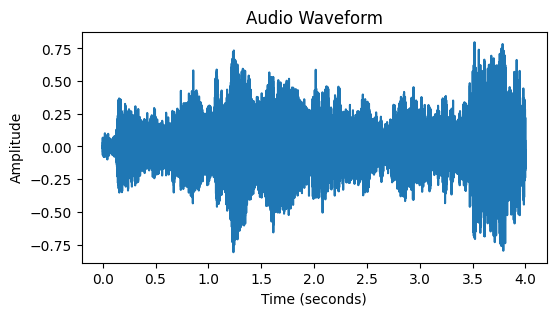

In [28]:
#Child CLass
file1 = '/content/audio_slice_files/folder_1/segment_224.wav'
plot_audio_with_time(file1)

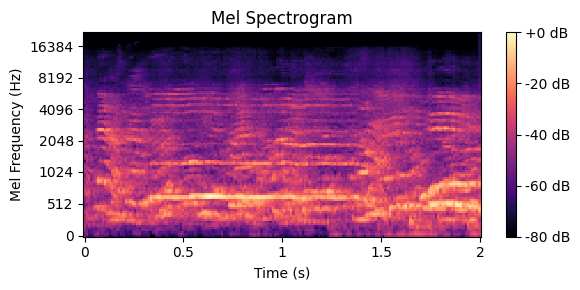

Number of time steps (num_frames): 128
Number of mel bands (num_mels): 173


In [29]:
plot_mel_spectrogram(file1)

## Tanpura

The sample rate of /content/audio_slice_files/folder_2/segment_1295.wav is: 44100 Hz


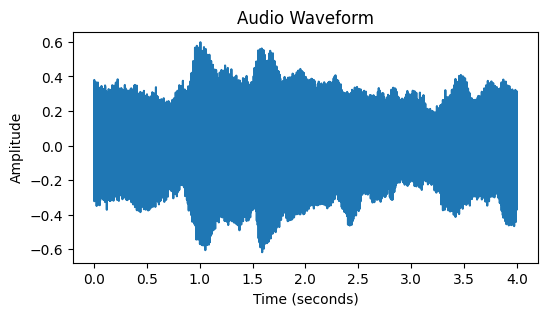

In [37]:
#Tanpura
file2 = '/content/audio_slice_files/folder_2/segment_1295.wav'
plot_audio_with_time(file2)

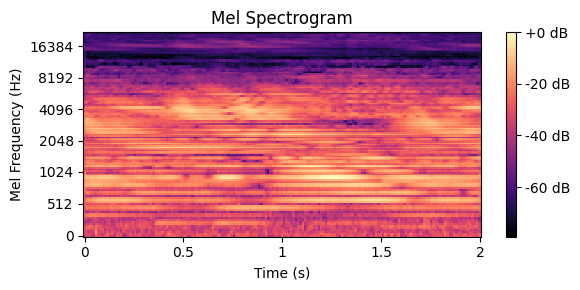

Number of time steps (num_frames): 128
Number of mel bands (num_mels): 173


In [38]:
plot_mel_spectrogram(file2)

## Traditional Song

The sample rate of /content/audio_slice_files/folder_2/segment_1653.wav is: 44100 Hz


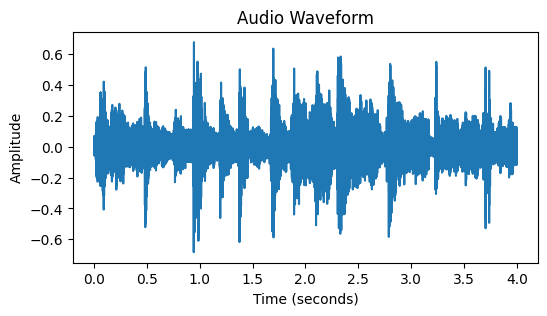

In [49]:
#Traditional Song
file3 = '/content/audio_slice_files/folder_2/segment_1653.wav'
plot_audio_with_time(file3)

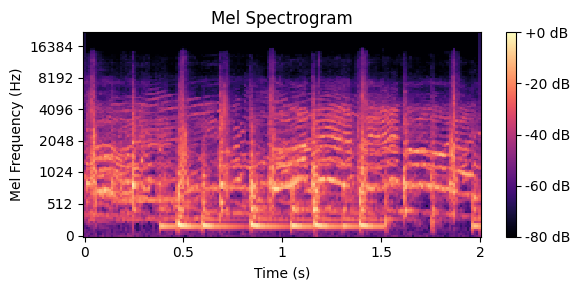

Number of time steps (num_frames): 128
Number of mel bands (num_mels): 173


In [44]:
plot_mel_spectrogram(file3)

## Traffic

The sample rate of /content/audio_slice_files/folder_2/segment_2364.wav is: 44100 Hz


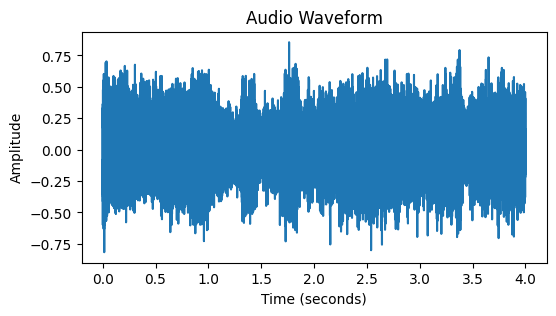

In [50]:
#Traffic
file4 = '/content/audio_slice_files/folder_2/segment_2364.wav'
plot_audio_with_time(file4)

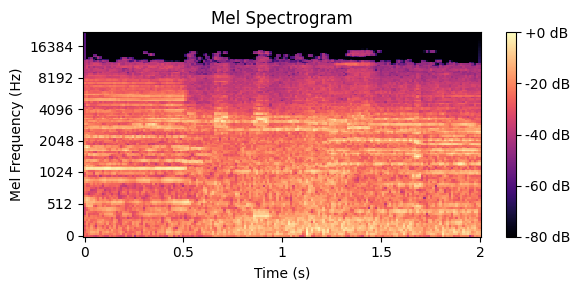

Number of time steps (num_frames): 128
Number of mel bands (num_mels): 173


In [51]:
plot_mel_spectrogram(file4)

## Train

The sample rate of /content/audio_slice_files/folder_2/segment_3370.wav is: 44100 Hz


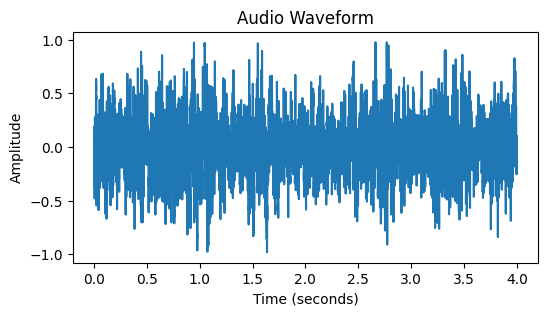

In [33]:
#Train
file5 = '/content/audio_slice_files/folder_2/segment_3370.wav'
plot_audio_with_time(file5)

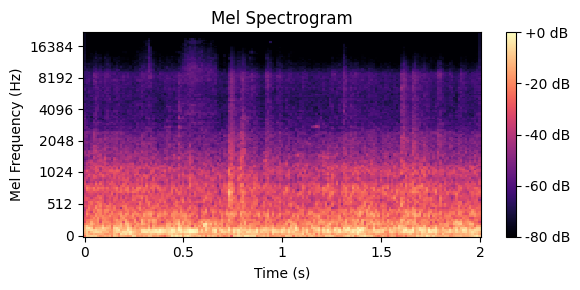

Number of time steps (num_frames): 128
Number of mel bands (num_mels): 173


In [34]:
plot_mel_spectrogram(file5)

# Data Processing

In [ ]:
file_path = '/content/audio_slice_files/segments_info.csv'

metadata = pd.read_csv(file_path)

In [91]:
metadata

,slice_file_name,slicing_start_time,slicing_end_time,classID,class_name,folder
0,segment_1.wav,0.0,4.0,1,children_class_noise,1
1,segment_2.wav,4.0,8.0,1,children_class_noise,8
2,segment_3.wav,8.0,12.0,1,children_class_noise,6
3,segment_4.wav,12.0,16.0,1,children_class_noise,3
4,segment_5.wav,16.0,20.0,1,children_class_noise,10
...,...,...,...,...,...,...
3745,segment_3746.wav,2980.0,2984.0,5,train,2
3746,segment_3747.wav,2984.0,2988.0,5,train,9
3747,segment_3748.wav,2988.0,2992.0,5,train,5
3748,segment_3749.wav,2992.0,2996.0,5,train,6


In [ ]:

metadata['classID'].value_counts()

1    750
2    750
3    750
4    750
5    750
Name: classID, dtype: int64

In [54]:
metadata.value_counts()

slice_file_name   slicing_start_time  slicing_end_time  classID  class_name            folder
segment_1.wav     0.0                 4.0               1        children_class_noise  1         1
segment_3252.wav  1004.0              1008.0            5        train                 10        1
segment_3241.wav  960.0               964.0             5        train                 3         1
segment_3242.wav  964.0               968.0             5        train                 3         1
segment_3243.wav  968.0               972.0             5        train                 7         1
                                                                                                ..
segment_2127.wav  2504.0              2508.0            3        traditional_Song      3         1
segment_2128.wav  2508.0              2512.0            3        traditional_Song      2         1
segment_2129.wav  2512.0              2516.0            3        traditional_Song      1         1
segment_213.wav

In [ ]:
file='/content/audio_slice_files/folder_1/segment_1.wav'
data, sample_rate = librosa.load(file, sr=None) 

print(f"The sample rate of {file} is: {sample_rate} Hz")

The sample rate of /content/audio_slice_files/folder_1/segment_1.wav is: 44100 Hz


# MFCC - Mel-Frequency Cepstral Coefficients

In [ ]:
import librosa
from sklearn.preprocessing import StandardScaler
import numpy as np

def features_extractor_standard(file_path, max_frames=400, n_mfcc=40):

    audio, sample_rate = librosa.load(file_path, sr=None, res_type='kaiser_fast')


    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=n_mfcc)

    if mfccs_features.shape[1] < max_frames:
        mfccs_features = np.pad(mfccs_features, ((0, 0), (0, max_frames - mfccs_features.shape[1])), mode='constant')
    else:
        mfccs_features = mfccs_features[:, :max_frames]

    scaler = StandardScaler()
    mfccs_scaled_features = scaler.fit_transform(mfccs_features)

    return mfccs_scaled_features

In [70]:
filename = '/content/audio_slice_files/folder_2/segment_2356.wav'
mfccs = features_extractor_standard(filename)    # sr - sample rate
print(mfccs.shape)

(40, 400)


In [71]:
mfccs         ## it is only for one  , we have 1499 remaining.

array([[-3.221683  , -2.548437  , -2.494497  , ...,  0.        ,
         0.        ,  0.        ],
       [ 5.088071  ,  5.174406  ,  4.9554634 , ...,  0.        ,
         0.        ,  0.        ],
       [-1.3239559 , -1.9130783 , -2.171842  , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [-0.22242057, -0.2093727 , -0.0825075 , ...,  0.        ,
         0.        ,  0.        ],
       [-0.07327133, -0.10732611,  0.05347792, ...,  0.        ,
         0.        ,  0.        ],
       [-0.01672081, -0.10645375, -0.05015542, ...,  0.        ,
         0.        ,  0.        ]], dtype=float32)

In [72]:
audio_dataset_path='/content/audio_slice_files/'
metadata=pd.read_csv('/content/audio_slice_files/segments_info.csv')
metadata.head(10)

,slice_file_name,slicing_start_time,slicing_end_time,classID,class_name,folder
0,segment_1.wav,0.0,4.0,1,children_class_noise,1
1,segment_2.wav,4.0,8.0,1,children_class_noise,8
2,segment_3.wav,8.0,12.0,1,children_class_noise,6
3,segment_4.wav,12.0,16.0,1,children_class_noise,3
4,segment_5.wav,16.0,20.0,1,children_class_noise,10
5,segment_6.wav,20.0,24.0,1,children_class_noise,5
6,segment_7.wav,24.0,28.0,1,children_class_noise,2
7,segment_8.wav,28.0,32.0,1,children_class_noise,1
8,segment_9.wav,32.0,36.0,1,children_class_noise,6
9,segment_10.wav,36.0,40.0,1,children_class_noise,6


In [ ]:
import numpy as np
from tqdm import tqdm
extracted_features=[]
for index_num,row in tqdm(metadata.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_dataset_path),'folder_'+str(row["folder"])+'/',str(row["slice_file_name"]))
    final_class_labels=row["class_name"]
    fold=row["folder"]
    data=features_extractor_standard(file_name)
    extracted_features.append([data,final_class_labels,fold])

3750it [02:28, 25.17it/s]


In [74]:
len(extracted_features)

3750

In [75]:
extracted_features[0]

[array([[-6.244998  , -6.244998  , -6.244998  , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.16012815,  0.16012815,  0.16012815, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.16012815,  0.16012815,  0.16012815, ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.16012815,  0.16012815,  0.16012815, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.16012815,  0.16012815,  0.16012815, ...,  0.        ,
          0.        ,  0.        ],
        [ 0.16012815,  0.16012815,  0.16012815, ...,  0.        ,
          0.        ,  0.        ]], dtype=float32),
 'children_class_noise',
 1]

In [ ]:

df = pd.DataFrame(extracted_features, columns=['Feature', 'class','fold'])

In [77]:
df.head(10)

,Feature,class,fold
0,"[[-6.244998, -6.244998, -6.244998, -6.244998, ...",children_class_noise,1
1,"[[-5.066206, -4.6945033, -4.691869, -4.826156,...",children_class_noise,8
2,"[[-4.901797, -4.530068, -4.5046086, -4.3944707...",children_class_noise,6
3,"[[-4.3480678, -3.9352648, -3.793931, -3.99862,...",children_class_noise,3
4,"[[-4.641555, -4.221295, -4.428598, -4.461928, ...",children_class_noise,10
5,"[[-3.7726321, -2.890776, -2.837267, -2.7850308...",children_class_noise,5
6,"[[-4.3780217, -4.020217, -4.098117, -4.1557617...",children_class_noise,2
7,"[[-5.1255007, -4.7723746, -4.471519, -4.499061...",children_class_noise,1
8,"[[-4.8178406, -4.37832, -4.3331995, -4.37375, ...",children_class_noise,6
9,"[[-3.6995482, -3.3163216, -3.3007195, -3.35526...",children_class_noise,6


In [78]:
df.dtypes

Feature    object
class      object
fold        int64
dtype: object

In [79]:
df['Feature'].shape

(3750,)

# Model Building and Compilation

In [ ]:
import numpy as np
from datetime import datetime
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()
y_all_encoded = labelencoder.fit_transform(df['class'])
y_all_one_hot = to_categorical(y_all_encoded)

num_folds = 10
folders = np.unique(df['fold'].values)

fold_accuracies = []

for fold in folders:
    print(f"Training on fold-{fold}")
    train_indices = df[df['fold'] != fold].index
    test_indices = df[df['fold'] == fold].index
    X_train = np.array(df['Feature'].iloc[train_indices].tolist())
    y_train = y_all_one_hot[train_indices]

    X_test = np.array(df['Feature'].iloc[test_indices].tolist())
    y_test = y_all_one_hot[test_indices]

    model = Sequential([
        layers.Conv1D(64, kernel_size=3, activation='relu', use_bias=False, input_shape=(40, 400)),
        layers.MaxPooling1D(pool_size=2),
        layers.Conv1D(128, kernel_size=3, activation='relu'),
        layers.MaxPooling1D(pool_size=2),
        layers.Flatten(),
        layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
        layers.Dropout(0.2),
        layers.Dense(5, activation='softmax')  
    ])

    optimizer = Adam(learning_rate=0.0001)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    log_dir = "logs06/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S") + f"_{fold}"
    tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    history = model.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_test, y_test),
        callbacks=[tensorboard_callback, early_stopping]
    )

    _, accuracy = model.evaluate(X_test, y_test)
    fold_accuracies.append(accuracy)

average_accuracy = np.mean(fold_accuracies)
print(f'Average Accuracy: {average_accuracy * 100:.2f}%')


Training on fold-1
Epoch 1/100
105/105 [==============================] - 4s 34ms/step - loss: 2.6396 - accuracy: 0.8232 - val_loss: 1.8797 - val_accuracy: 0.9925
Epoch 2/100
105/105 [==============================] - 2s 21ms/step - loss: 1.6654 - accuracy: 0.9875 - val_loss: 1.4292 - val_accuracy: 1.0000
Epoch 3/100
105/105 [==============================] - 2s 20ms/step - loss: 1.2775 - accuracy: 0.9937 - val_loss: 1.1049 - val_accuracy: 0.9975
Epoch 4/100
105/105 [==============================] - 2s 20ms/step - loss: 0.9870 - accuracy: 0.9955 - val_loss: 0.8587 - val_accuracy: 0.9975
Epoch 5/100
105/105 [==============================] - 2s 20ms/step - loss: 0.7696 - accuracy: 0.9976 - val_loss: 0.6749 - val_accuracy: 0.9975
Epoch 6/100
105/105 [==============================] - 2s 22ms/step - loss: 0.6035 - accuracy: 0.9979 - val_loss: 0.5317 - val_accuracy: 0.9975
Epoch 7/100
105/105 [==============================] - 3s 31ms/step - loss: 0.4816 - accuracy: 0.9979 - val_loss: 0.4

In [81]:
fold_accuracies

[1.0,
 1.0,
 1.0,
 1.0,
 0.9970588088035583,
 1.0,
 1.0,
 0.9949495196342468,
 1.0,
 1.0]

In [90]:
average_accuracy = np.mean(fold_accuracies)
print(f'Average Accuracy: {average_accuracy * 100:.2f}%')

Average Accuracy: 99.92%


# Tensor Board

In [ ]:

%load_ext tensorboard

%tensorboard --logdir logs06/fit

<IPython.core.display.Javascript object>

# Save the Model

In [ ]:

model.save("My_model.h5")

In [85]:
from tensorflow.keras.models import load_model
best_model = load_model('/content/My_model.h5')

In [ ]:
import librosa
import numpy as np
from tensorflow.keras.models import load_model


filename = "/content/audio_slice_files/folder_4/segment_1003.wav"
sample_features = features_extractor_standard(filename)

num_frames = sample_features.shape[0]
num_features = sample_features.shape[1]

X_sample_reshaped = sample_features.reshape((1, num_frames, num_features))


predictions = best_model.predict(X_sample_reshaped)

predicted_label = np.argmax(predictions)

print("Predicted Label:", predicted_label)


1/1 [==============================] - 0s 240ms/step
Predicted Label: 1


In [ ]:
prediction_class = labelencoder.inverse_transform([predicted_label])
print(prediction_class)

['tanpura']
